In [100]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import math
df = pd.read_csv("C:\\Users\\User\\OneDrive\\Documents\diabetes_binary_5050split_health_indicators_BRFSS2015.csv")

In [101]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,StandardScaler,MinMaxScaler,PowerTransformer,FunctionTransformer
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression,RidgeClassifier,LassoCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, plot_confusion_matrix


In [102]:
#load the dataset
df=pd.read_csv("diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


In [103]:
#check the rows and columns number.
print(f"number of rows:--> {df.shape[0]} and number of columns:--> {df.shape[1]}")

number of rows:--> 70692 and number of columns:--> 22


In [104]:
df.shape

(70692, 22)

In [105]:
#chack the data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  float64
 1   HighBP                70692 non-null  float64
 2   HighChol              70692 non-null  float64
 3   CholCheck             70692 non-null  float64
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  float64
 6   Stroke                70692 non-null  float64
 7   HeartDiseaseorAttack  70692 non-null  float64
 8   PhysActivity          70692 non-null  float64
 9   Fruits                70692 non-null  float64
 10  Veggies               70692 non-null  float64
 11  HvyAlcoholConsump     70692 non-null  float64
 12  AnyHealthcare         70692 non-null  float64
 13  NoDocbcCost           70692 non-null  float64
 14  GenHlth               70692 non-null  float64
 15  MentHlth           

In [106]:
#check for missing numbers
def checking_m(df):
    null_v = df.isnull().sum().sort_values(ascending=False)
    null_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    null_v = pd.concat([null_v, null_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return null_v

checking_m(df)

,Missing_Number,Missing_Percent
Diabetes_binary,0,0.0
HighBP,0,0.0
Education,0,0.0
Age,0,0.0
Sex,0,0.0
DiffWalk,0,0.0
PhysHlth,0,0.0
MentHlth,0,0.0
GenHlth,0,0.0
NoDocbcCost,0,0.0


In [107]:
#check for dublicated rows
print("Numbers of duplicated rows :",df.duplicated().sum())

Numbers of duplicated rows : 1635


In [108]:
#dropping the duplicated rows 
df=df.drop_duplicates(keep="first")
print("After removing,now number of duplicated rows are:",df.duplicated().sum())

After removing,now number of duplicated rows are: 0


In [109]:
#check data description
df.describe().T.style.bar(subset=['mean'], color='#205ff2').background_gradient(subset=['std'], cmap='mako').background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
Diabetes_binary,69057.000000,0.508232,0.499936,0.000000,0.000000,1.000000,1.000000,1.000000
HighBP,69057.000000,0.571224,0.494905,0.000000,0.000000,1.000000,1.000000,1.000000
HighChol,69057.000000,0.531329,0.499021,0.000000,0.000000,1.000000,1.000000,1.000000
CholCheck,69057.000000,0.974803,0.156723,0.000000,1.000000,1.000000,1.000000,1.000000
BMI,69057.000000,29.955834,7.147972,12.000000,25.000000,29.000000,33.000000,98.000000
Smoker,69057.000000,0.481935,0.499677,0.000000,0.000000,0.000000,1.000000,1.000000
Stroke,69057.000000,0.063643,0.244118,0.000000,0.000000,0.000000,0.000000,1.000000
HeartDiseaseorAttack,69057.000000,0.150875,0.357930,0.000000,0.000000,0.000000,0.000000,1.000000
PhysActivity,69057.000000,0.696483,0.459780,0.000000,0.000000,1.000000,1.000000,1.000000
Fruits,69057.000000,0.605659,0.488712,0.000000,0.000000,1.000000,1.000000,1.000000


In [110]:
#check the correlation between terget and each of columns
df.corr()["Diabetes_binary"]

Diabetes_binary         1.000000
HighBP                  0.372048
HighChol                0.281399
CholCheck               0.118900
BMI                     0.285643
Smoker                  0.075853
Stroke                  0.122727
HeartDiseaseorAttack    0.207229
PhysActivity           -0.150281
Fruits                 -0.044560
Veggies                -0.072181
HvyAlcoholConsump      -0.098709
AnyHealthcare           0.027034
NoDocbcCost             0.036145
GenHlth                 0.396571
MentHlth                0.080688
PhysHlth                0.206868
DiffWalk                0.267082
Sex                     0.042538
Age                     0.274550
Education              -0.158522
Income                 -0.212846
Name: Diabetes_binary, dtype: float64

<AxesSubplot:>

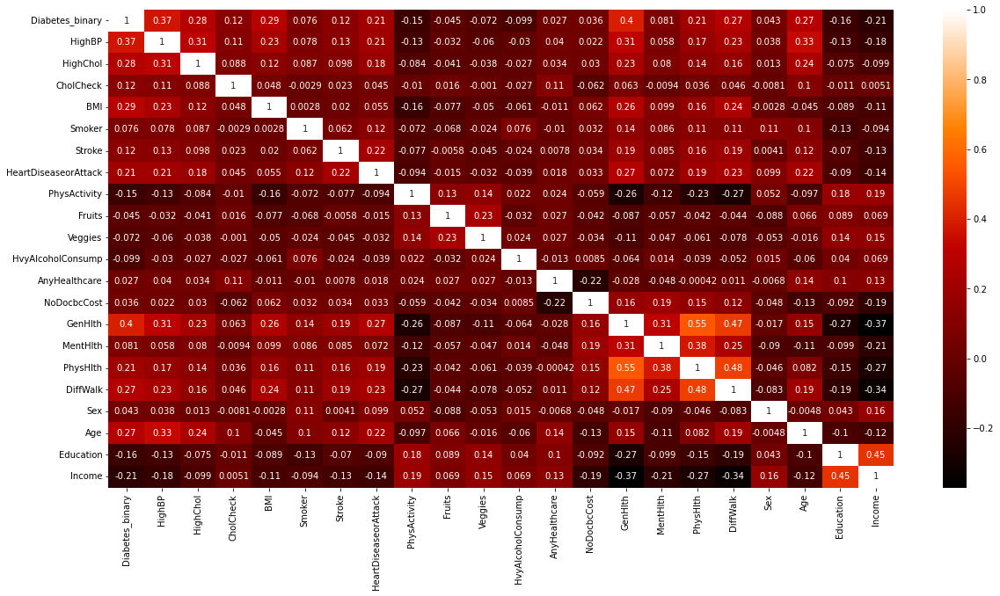

In [111]:
plt.figure(figsize=(20,10))

#plot heat map
sns.heatmap(df.corr(),annot=True,cmap="gist_heat")

In [112]:
df.Diabetes_binary.value_counts()

1.0    35097
0.0    33960
Name: Diabetes_binary, dtype: int64

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Diabetes_binary', ylabel='count'>

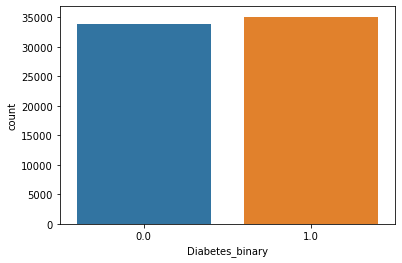

In [113]:
sns.countplot(df.Diabetes_binary)

In [114]:
X=df.drop("Diabetes_binary",axis=1)
y=df.Diabetes_binary

In [115]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X, y)
mutual_info

array([0.07278999, 0.04403808, 0.0157682 , 0.05391866, 0.0041104 ,
       0.00772953, 0.02069466, 0.01549781, 0.00257547, 0.0090956 ,
       0.00434825, 0.00945134, 0.00124814, 0.09099394, 0.00210767,
       0.02456133, 0.03714667, 0.00517924, 0.04646491, 0.01193521,
       0.02428744])

In [116]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X.columns
mutual_info.sort_values(ascending=False)

GenHlth                 0.090994
HighBP                  0.072790
BMI                     0.053919
Age                     0.046465
HighChol                0.044038
DiffWalk                0.037147
PhysHlth                0.024561
Income                  0.024287
HeartDiseaseorAttack    0.020695
CholCheck               0.015768
PhysActivity            0.015498
Education               0.011935
AnyHealthcare           0.009451
Veggies                 0.009096
Stroke                  0.007730
Sex                     0.005179
HvyAlcoholConsump       0.004348
Smoker                  0.004110
Fruits                  0.002575
MentHlth                0.002108
NoDocbcCost             0.001248
dtype: float64

<AxesSubplot:>

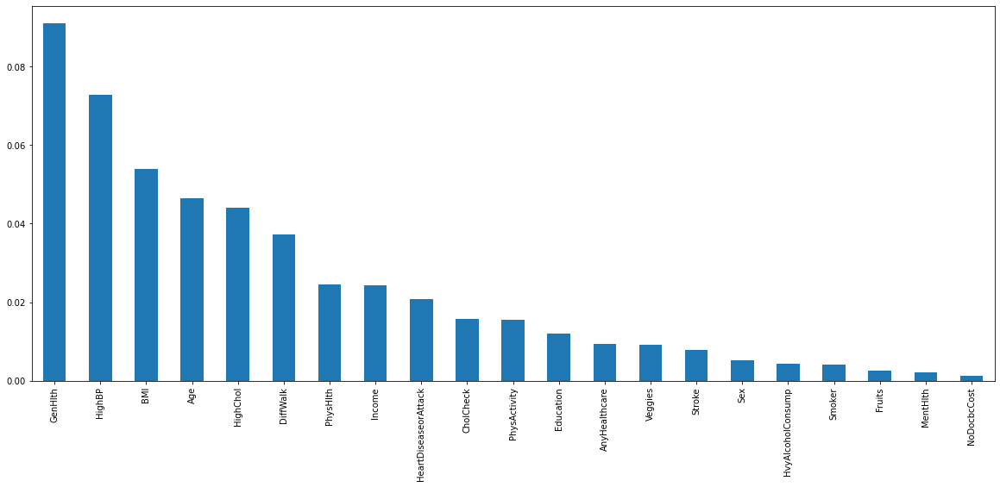

In [117]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20,8))

In [118]:
df.drop('NoDocbcCost',axis = 1,inplace= True)

In [119]:
df.shape

(69057, 21)

In [120]:
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,0.0,1.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,0.0,1.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,0.0,1.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,0.0,1.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


In [121]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69057 entries, 0 to 70691
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       69057 non-null  float64
 1   HighBP                69057 non-null  float64
 2   HighChol              69057 non-null  float64
 3   CholCheck             69057 non-null  float64
 4   BMI                   69057 non-null  float64
 5   Smoker                69057 non-null  float64
 6   Stroke                69057 non-null  float64
 7   HeartDiseaseorAttack  69057 non-null  float64
 8   PhysActivity          69057 non-null  float64
 9   Fruits                69057 non-null  float64
 10  Veggies               69057 non-null  float64
 11  HvyAlcoholConsump     69057 non-null  float64
 12  AnyHealthcare         69057 non-null  float64
 13  GenHlth               69057 non-null  float64
 14  MentHlth              69057 non-null  float64
 15  PhysHlth           

In [122]:
df.drop('Sex',axis = 1,inplace= True)
df.drop('HvyAlcoholConsump',axis = 1,inplace= True)
df.drop('Fruits',axis = 1,inplace= True)
df.drop('MentHlth',axis = 1,inplace= True)
df.drop('Smoker',axis = 1,inplace= True)



In [123]:
df.shape

(69057, 16)

In [124]:
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Stroke,HeartDiseaseorAttack,PhysActivity,Veggies,AnyHealthcare,GenHlth,PhysHlth,DiffWalk,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,1.0,1.0,1.0,3.0,30.0,0.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,1.0,1.0,1.0,1.0,10.0,0.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,0.0,0.0,1.0,1.0,1.0,3.0,3.0,0.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,0.0,8.0,5.0,8.0


In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69057 entries, 0 to 70691
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       69057 non-null  float64
 1   HighBP                69057 non-null  float64
 2   HighChol              69057 non-null  float64
 3   CholCheck             69057 non-null  float64
 4   BMI                   69057 non-null  float64
 5   Stroke                69057 non-null  float64
 6   HeartDiseaseorAttack  69057 non-null  float64
 7   PhysActivity          69057 non-null  float64
 8   Veggies               69057 non-null  float64
 9   AnyHealthcare         69057 non-null  float64
 10  GenHlth               69057 non-null  float64
 11  PhysHlth              69057 non-null  float64
 12  DiffWalk              69057 non-null  float64
 13  Age                   69057 non-null  float64
 14  Education             69057 non-null  float64
 15  Income             

In [126]:
# separating the data and labels
X = df.drop(columns = 'Diabetes_binary', axis=1)
Y = df['Diabetes_binary']

In [127]:
print(X)

       HighBP  HighChol  CholCheck   BMI  Stroke  HeartDiseaseorAttack  \
0         1.0       0.0        1.0  26.0     0.0                   0.0   
1         1.0       1.0        1.0  26.0     1.0                   0.0   
2         0.0       0.0        1.0  26.0     0.0                   0.0   
3         1.0       1.0        1.0  28.0     0.0                   0.0   
4         0.0       0.0        1.0  29.0     0.0                   0.0   
...       ...       ...        ...   ...     ...                   ...   
70687     0.0       1.0        1.0  37.0     0.0                   0.0   
70688     0.0       1.0        1.0  29.0     0.0                   1.0   
70689     1.0       1.0        1.0  25.0     0.0                   1.0   
70690     1.0       1.0        1.0  18.0     0.0                   0.0   
70691     1.0       1.0        1.0  25.0     0.0                   1.0   

       PhysActivity  Veggies  AnyHealthcare  GenHlth  PhysHlth  DiffWalk  \
0               1.0      1.0       

In [128]:
print(Y)

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
70687    1.0
70688    1.0
70689    1.0
70690    1.0
70691    1.0
Name: Diabetes_binary, Length: 69057, dtype: float64


In [129]:
#It is a good practise to split the data to avoiding the data leakage 
#train test split  
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.2,random_state=42)
print("X_train shape: ",x_train.shape)
print("X_test shape: ",x_test.shape)
print("Y_train shape: ",y_train.shape)
print("Y_test shape: ",y_test.shape)

X_train shape:  (55245, 15)
X_test shape:  (13812, 15)
Y_train shape:  (55245,)
Y_test shape:  (13812,)


# Standard Scaler

In [130]:
from sklearn.preprocessing import StandardScaler
std=StandardScaler()

In [131]:
x_train=std.fit_transform(x_train)
x_test=std.transform(x_test)

In [132]:
x_train

array([[-1.15446282,  0.93912842,  0.16089202, ...,  0.48773474,
         0.09997527,  0.62064079],
       [ 0.86620373, -1.0648171 ,  0.16089202, ...,  1.53531866,
         1.07099034,  0.62064079],
       [ 0.86620373,  0.93912842,  0.16089202, ..., -0.21065453,
        -0.8710398 , -1.22167291],
       ...,
       [ 0.86620373,  0.93912842,  0.16089202, ...,  1.18612402,
        -1.84205487, -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -0.55984917,
        -0.8710398 , -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -1.60743309,
         1.07099034,  1.08121921]])

# Machine Learning

In [133]:
#training accuracy
lr=LogisticRegression()
lr.fit(x_train, y_train)
y_pred=lr.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")



Accuracy :--->> 0.7484795829713293

              precision    recall  f1-score   support

         0.0       0.75      0.73      0.74      6723
         1.0       0.75      0.77      0.76      7089

    accuracy                           0.75     13812
   macro avg       0.75      0.75      0.75     13812
weighted avg       0.75      0.75      0.75     13812

Confusion matrix:--->>
 [[4881 1842]
 [1632 5457]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

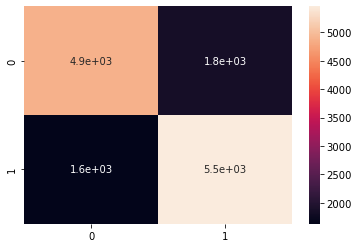

In [134]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [135]:
#training accuracy
rf=RandomForestClassifier()
rf.fit(x_train, y_train)
y_pred=rf.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Accuracy :--->> 0.7237185056472633

              precision    recall  f1-score   support

         0.0       0.73      0.69      0.71      6723
         1.0       0.72      0.76      0.74      7089

    accuracy                           0.72     13812
   macro avg       0.72      0.72      0.72     13812
weighted avg       0.72      0.72      0.72     13812

Confusion matrix:--->>
 [[4636 2087]
 [1729 5360]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

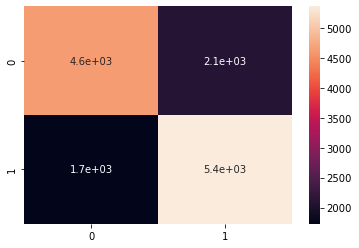

In [136]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [137]:
#training accuracy
dt=DecisionTreeClassifier()
dt.fit(x_train, y_train)
y_pred=dt.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Accuracy :--->> 0.653706921517521

              precision    recall  f1-score   support

         0.0       0.63      0.68      0.66      6723
         1.0       0.67      0.63      0.65      7089

    accuracy                           0.65     13812
   macro avg       0.65      0.65      0.65     13812
weighted avg       0.66      0.65      0.65     13812

Confusion matrix:--->>
 [[4576 2147]
 [2636 4453]]

<<<<------------------------------------------------------------->>>>



In [138]:
#training accuracy
ab=AdaBoostClassifier()
ab.fit(x_train, y_train)
y_pred=ab.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Accuracy :--->> 0.7541268462206777

              precision    recall  f1-score   support

         0.0       0.76      0.73      0.74      6723
         1.0       0.75      0.78      0.76      7089

    accuracy                           0.75     13812
   macro avg       0.75      0.75      0.75     13812
weighted avg       0.75      0.75      0.75     13812

Confusion matrix:--->>
 [[4892 1831]
 [1565 5524]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

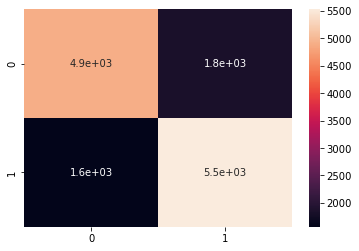

In [139]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)


In [140]:
#training accuracy
xgb=XGBClassifier(learning_rate=0.1,n_estimators=50)
xgb.fit(x_train, y_train)
y_pred=xgb.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Accuracy :--->> 0.7539096437880104

              precision    recall  f1-score   support

         0.0       0.77      0.71      0.74      6723
         1.0       0.74      0.80      0.77      7089

    accuracy                           0.75     13812
   macro avg       0.76      0.75      0.75     13812
weighted avg       0.75      0.75      0.75     13812

Confusion matrix:--->>
 [[4757 1966]
 [1433 5656]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

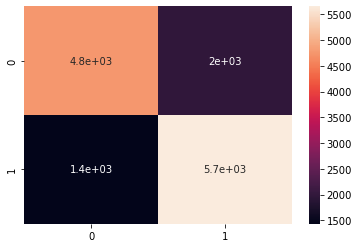

In [141]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [142]:
#training accuracy
gnb=GaussianNB()
gnb.fit(x_train, y_train)
y_pred=gnb.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Accuracy :--->> 0.7208224732117

              precision    recall  f1-score   support

         0.0       0.70      0.74      0.72      6723
         1.0       0.74      0.70      0.72      7089

    accuracy                           0.72     13812
   macro avg       0.72      0.72      0.72     13812
weighted avg       0.72      0.72      0.72     13812

Confusion matrix:--->>
 [[4989 1734]
 [2122 4967]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

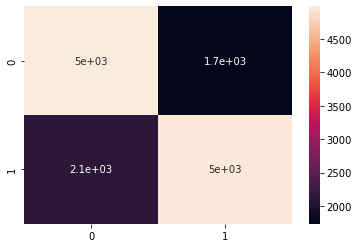

In [143]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

Accuracy :--->> 0.7127135823921228

              precision    recall  f1-score   support

         0.0       0.71      0.69      0.70      6723
         1.0       0.71      0.74      0.72      7089

    accuracy                           0.71     13812
   macro avg       0.71      0.71      0.71     13812
weighted avg       0.71      0.71      0.71     13812

Confusion matrix:--->>
 [[4624 2099]
 [1869 5220]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

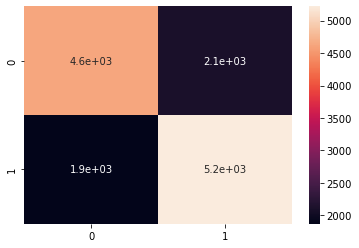

In [144]:
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
y_pred=knn.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

# Deep Learning

In [145]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPool1D
from keras.optimizers import RMSprop,Adam
from tensorflow.keras.layers import Embedding
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM, Dense
import tensorflow as tf

In [146]:
df.shape

(69057, 16)

In [147]:
# Define the model architecture
model = Sequential()
model.add(Dense(16, input_dim=15, activation='relu'))
model.add(Dense(32, input_dim=15, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=80)

# Train the model
history=model.fit(x_train, y_train, epochs=10, batch_size=10, callbacks=callback)

Epoch 1/10
5525/5525 [==============================] - 24s 4ms/step - loss: 0.5280 - accuracy: 0.7366
Epoch 2/10
5525/5525 [==============================] - 22s 4ms/step - loss: 0.5170 - accuracy: 0.7426
Epoch 3/10
5525/5525 [==============================] - 26s 5ms/step - loss: 0.5154 - accuracy: 0.7456
Epoch 4/10
5525/5525 [==============================] - 19s 4ms/step - loss: 0.5144 - accuracy: 0.7451
Epoch 5/10
5525/5525 [==============================] - 22s 4ms/step - loss: 0.5138 - accuracy: 0.7459
Epoch 6/10
5525/5525 [==============================] - 24s 4ms/step - loss: 0.5132 - accuracy: 0.7453
Epoch 7/10
5525/5525 [==============================] - 25s 5ms/step - loss: 0.5127 - accuracy: 0.7470
Epoch 8/10
5525/5525 [==============================] - 27s 5ms/step - loss: 0.5126 - accuracy: 0.7460
Epoch 9/10
5525/5525 [==============================] - 30s 5ms/step - loss: 0.5120 - accuracy: 0.7462
Epoch 10/10
5525/5525 [==============================] - 29s 5ms/step - l

In [148]:
y_pred=model.predict(x_test)
y_pred=(y_pred>0.5)

432/432 [==============================] - 1s 3ms/step


In [149]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm=confusion_matrix(y_test,y_pred)

Text(69.0, 0.5, 'Predicted Values')

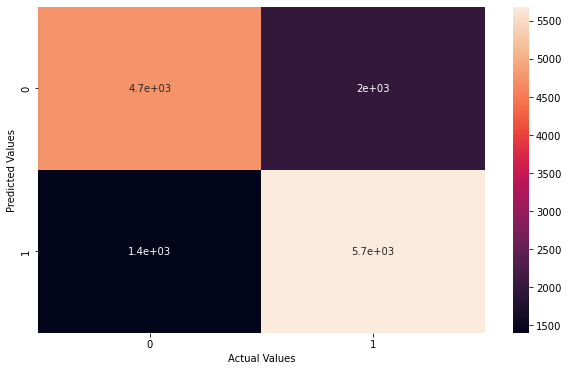

In [150]:
plt.figure(figsize=(10,6))
sns.heatmap(cm,annot=True)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

In [151]:
accuracy_score(y_test,y_pred)

0.7552128583840139

In [152]:
# Print the evaluation metrics for the dataset.
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.77      0.71      0.74      6723
         1.0       0.74      0.80      0.77      7089

    accuracy                           0.76     13812
   macro avg       0.76      0.75      0.75     13812
weighted avg       0.76      0.76      0.75     13812



In [153]:
accuracy = history.history['accuracy']
loss = history.history['loss']

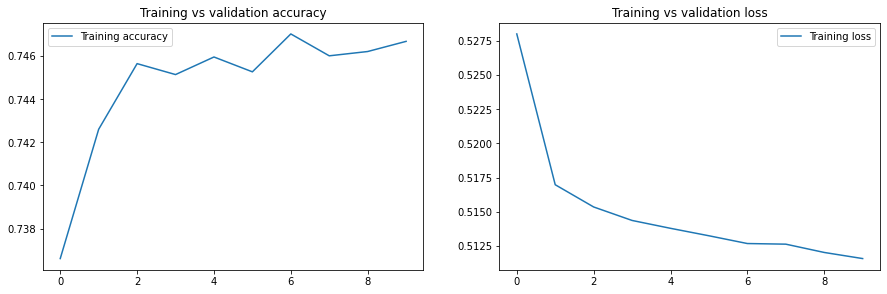

In [154]:
plt.figure(figsize=(15,10))

plt.subplot(2, 2, 1)
plt.plot(accuracy, label = "Training accuracy")
plt.legend()
plt.title("Training vs validation accuracy")


plt.subplot(2,2,2)
plt.plot(loss, label = "Training loss")
plt.legend()
plt.title("Training vs validation loss")

plt.show()

# LIME

In [205]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd

In [226]:
np.array(x_train)

array([[-1.15446282,  0.93912842,  0.16089202, ...,  0.48773474,
         0.09997527,  0.62064079],
       [ 0.86620373, -1.0648171 ,  0.16089202, ...,  1.53531866,
         1.07099034,  0.62064079],
       [ 0.86620373,  0.93912842,  0.16089202, ..., -0.21065453,
        -0.8710398 , -1.22167291],
       ...,
       [ 0.86620373,  0.93912842,  0.16089202, ...,  1.18612402,
        -1.84205487, -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -0.55984917,
        -0.8710398 , -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -1.60743309,
         1.07099034,  1.08121921]])

In [227]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(x_train),  
mode='classification',verbose=True,feature_names=X.columns)

In [228]:
X.iloc[1]

HighBP                   1.0
HighChol                 1.0
CholCheck                1.0
BMI                     26.0
Stroke                   1.0
HeartDiseaseorAttack     0.0
PhysActivity             0.0
Veggies                  0.0
AnyHealthcare            1.0
GenHlth                  3.0
PhysHlth                 0.0
DiffWalk                 0.0
Age                     12.0
Education                6.0
Income                   8.0
Name: 1, dtype: float64

In [225]:
exp1 = explainer.explain_instance(X.iloc[1].astype(int).values,lr.predict_proba, num_features=15)
exp1.show_in_notebook(show_table=True)

Intercept 0.41913523760699545
Prediction_local [1.02524123]
Right: 0.999999999148069


In [160]:
exp2 = explainer.explain_instance(X.iloc[1].astype(int).values,rf.predict_proba, num_features=15)
exp2.show_in_notebook(show_table=True)

Intercept 0.9106942963413087
Prediction_local [0.67189545]
Right: 0.68


In [161]:
exp3 = explainer.explain_instance(X.iloc[1].astype(int).values,dt.predict_proba, num_features=15)
exp3.show_in_notebook(show_table=True)

Intercept 1.0
Prediction_local [1.]
Right: 1.0


In [162]:
exp4 = explainer.explain_instance(X.iloc[1].astype(int).values,ab.predict_proba, num_features=15)
exp4.show_in_notebook(show_table=True)

Intercept 0.5097357271134445
Prediction_local [0.50804032]
Right: 0.5080456793464939


In [163]:
exp5 = explainer.explain_instance(X.iloc[1].astype(int).values,xgb.predict_proba, num_features=15)
exp5.show_in_notebook(show_table=True)

Intercept 0.8891978693066017
Prediction_local [0.86258693]
Right: 0.86106616


In [164]:
exp6 = explainer.explain_instance(X.iloc[1].astype(int).values,gnb.predict_proba, num_features=15)
exp6.show_in_notebook(show_table=True)

Intercept 1.0000000298976375
Prediction_local [0.99999993]
Right: 1.0


In [165]:
exp7 = explainer.explain_instance(X.iloc[1].astype(int).values,knn.predict_proba, num_features=15)
exp7.show_in_notebook(show_table=True)

Intercept 0.8167919671976815
Prediction_local [0.68598393]
Right: 0.6


In [166]:
exp1.as_list()

[('PhysHlth <= 0.00', 1.3154586706025626e-07),
 ('25.00 < BMI <= 29.00', 1.1035508847880242e-07),
 ('Age > 11.00', 1.099124014016075e-07),
 ('Stroke > 0.00', 7.462296320198044e-08),
 ('2.00 < GenHlth <= 3.00', 6.190050442125458e-08),
 ('DiffWalk <= 0.00', -6.015072835645133e-08),
 ('0.00 < HighChol <= 1.00', 5.878734648063723e-08),
 ('0.00 < HighBP <= 1.00', 5.7495109776538814e-08),
 ('6.00 < Income <= 8.00', -4.6694225344004555e-08),
 ('HeartDiseaseorAttack <= 0.00', -2.580123702643453e-08),
 ('5.00 < Education <= 6.00', -1.8419431662502243e-08),
 ('PhysActivity <= 0.00', -1.329777424077206e-08),
 ('CholCheck <= 1.00', 0.0),
 ('AnyHealthcare <= 1.00', 0.0),
 ('Veggies <= 1.00', 0.0)]

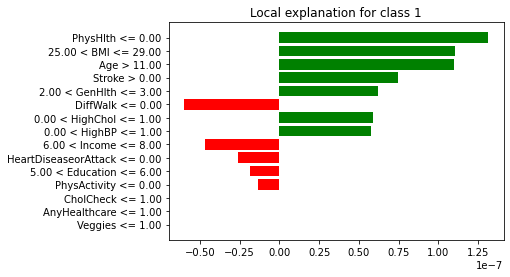

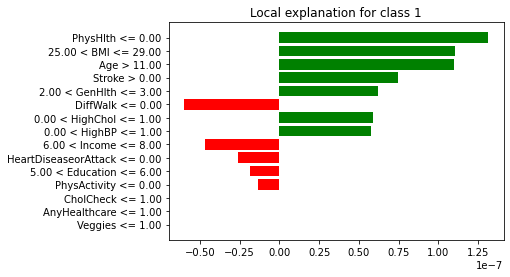

In [167]:
exp1.as_pyplot_figure()

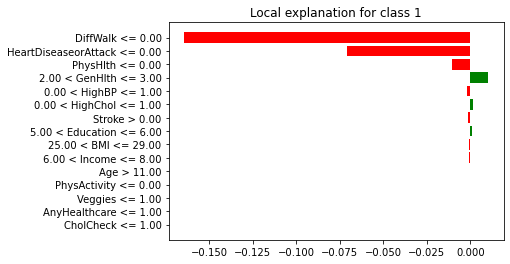

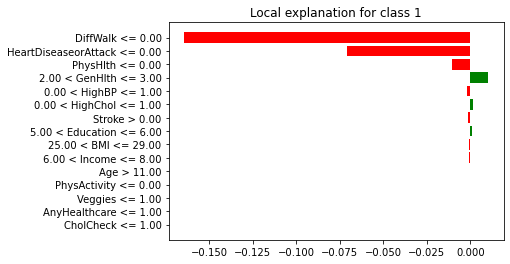

In [168]:
exp2.as_pyplot_figure()

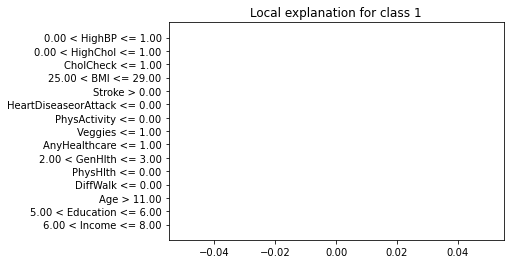

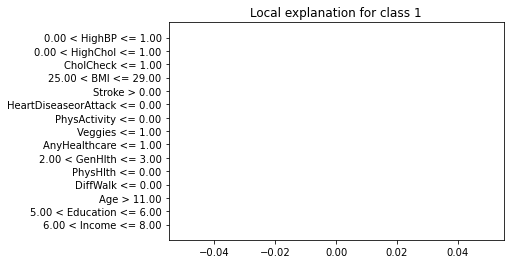

In [169]:
exp3.as_pyplot_figure()

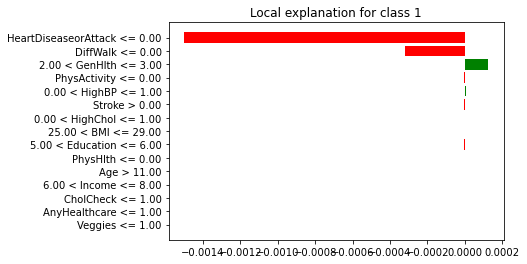

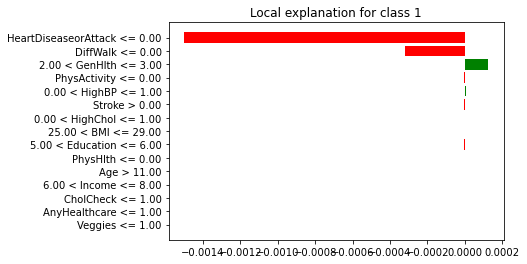

In [170]:
exp4.as_pyplot_figure()

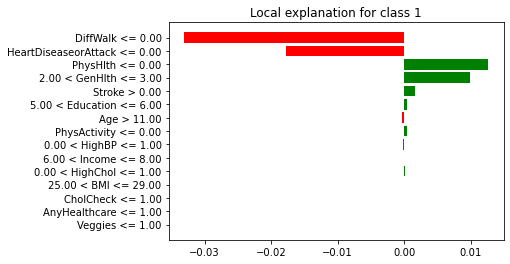

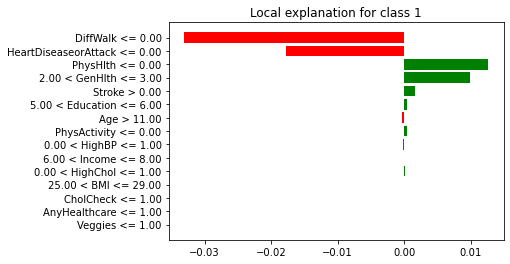

In [171]:
exp5.as_pyplot_figure()

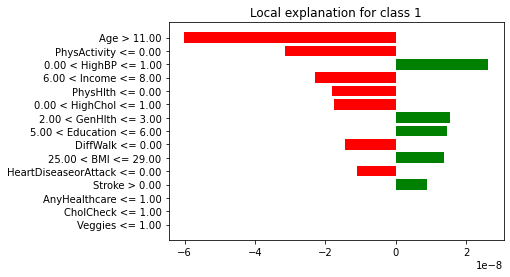

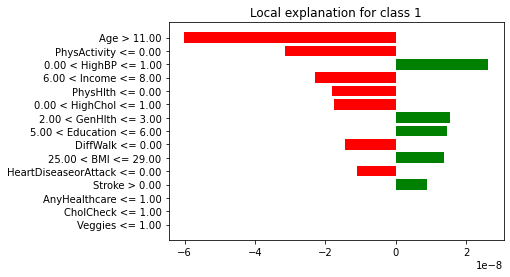

In [172]:
exp6.as_pyplot_figure()

In [173]:
exp7.as_list()

[('PhysHlth <= 0.00', -0.17595622336658864),
 ('5.00 < Education <= 6.00', 0.057426515553222195),
 ('6.00 < Income <= 8.00', -0.05036973851125689),
 ('0.00 < HighBP <= 1.00', 0.031147493563612048),
 ('HeartDiseaseorAttack <= 0.00', -0.013532759347604997),
 ('PhysActivity <= 0.00', 0.009450950129472578),
 ('Age > 11.00', 0.00890384190957982),
 ('2.00 < GenHlth <= 3.00', 0.006866772755756067),
 ('0.00 < HighChol <= 1.00', -0.005655590466449421),
 ('25.00 < BMI <= 29.00', 0.0029269462313926214),
 ('DiffWalk <= 0.00', -0.002014213970782819),
 ('Stroke > 0.00', -2.033021062597338e-06),
 ('CholCheck <= 1.00', 0.0),
 ('AnyHealthcare <= 1.00', 0.0),
 ('Veggies <= 1.00', 0.0)]

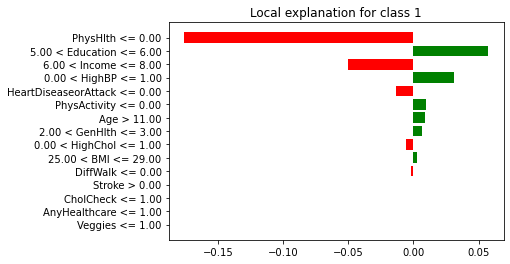

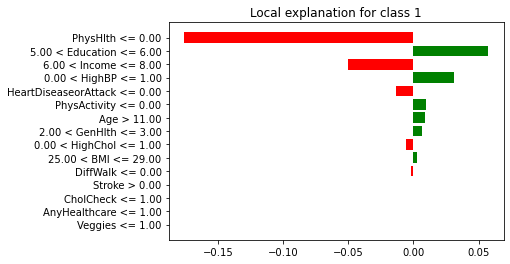

In [174]:
exp7.as_pyplot_figure()

In [177]:
X.iloc[1]

HighBP                   1.0
HighChol                 1.0
CholCheck                1.0
BMI                     26.0
Stroke                   1.0
HeartDiseaseorAttack     0.0
PhysActivity             0.0
Veggies                  0.0
AnyHealthcare            1.0
GenHlth                  3.0
PhysHlth                 0.0
DiffWalk                 0.0
Age                     12.0
Education                6.0
Income                   8.0
Name: 1, dtype: float64

In [193]:
from pylab import *


In [194]:
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(x_train, feature_names=X.columns, class_names=['No Diabetes', 'Diabetes'], discretize_continuous=True)
exp8 = explainer.explain_instance(X.iloc[0].astype(int).values,model.predict, num_features=15)
exp8.show_in_notebook(show_table=True)

157/157 [==============================] - 0s 2ms/step


C:\Users\User\anaconda3\lib\site-packages\lime\lime_tabular.py:372: UserWarning: 
                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    
  warnings.warn("""


IndexError: index 1 is out of bounds for axis 1 with size 1